In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import h5py

import tensorflow as tf
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt

from time import time
from icecream import ic

from msfm.utils import tfrecords, files, parameters
from msfm.fiducial_pipeline import FiducialPipeline
from msfm.utils.input_output import read_yaml

23-12-20 16:44:39   imports.py INF   Setting up healpy to run on 8 CPUs 
23-12-20 16:44:40   imports.py INF   Setting up healpy to run on 8 CPUs 


# v4 of the pipeline (multiple poisson noise realizations)

In [3]:
# tfr_pattern = "/pscratch/sd/a/athomsen/DESY3/v4/extra_large_scales/tfrecords/fiducial/DESy3_fiducial_000.tfrecord"
# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v4/large_scales/tfrecords/fiducial/DESy3_fiducial_000.tfrecord"

# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/tfrecords/fiducial/DESy3linear_fiducial_000.tfrecord"
# conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/config.yaml"
# params = ["Om", "s8", "Aia", "n_Aia", "bg", "n_bg"]
# filename_suffix = "_linear"

# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/tfrecords/fiducial/DESy3quadratic_fiducial_000.tfrecord"
# conf="/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/config_quadratic_bias.yaml"
# params = ["Om", "s8", "Aia", "n_Aia", "bg", "n_bg", "bg2", "n_bg2"]
# filename_suffix = "_quadratic"




# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/linear_bias/tfrecords/fiducial/DESy3_fiducial_000.tfrecord"
# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/linear_bias/debug/DESy3_fiducial_000.tfrecord"
# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/DESy3linear_fiducial_000.tfrecord"
# conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/v5/linear_bias.yaml"
# params = ["Om", "s8", "Aia", "n_Aia", "bg", "n_bg"]
# filename_suffix = "_linear_v2"

# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/quadratic_bias/tfrecords/fiducial/DESy3_fiducial_000.tfrecord"
# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/quadratic_bias/debug/DESy3_fiducial_000.tfrecord"
# conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/v5/quadratic_bias.yaml"
# params = ["Om", "s8", "Aia", "n_Aia", "bg", "n_bg", "bg2", "n_bg2"]
# filename_suffix = "_quadratic"

# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/DESy3bias_2_fiducial_000.tfrecord"
# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/DESy3bias_1_fiducial_000.tfrecord"
# conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/v5/quadratic_bias.yaml"
# params = ["Om", "s8", "Aia", "n_Aia", "bg", "n_bg", "bg2", "n_bg2"]
# filename_suffix = "_quadratic_v1"

# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/stochasticity/tfrecords/fiducial/DESy3_fiducial_000.tfrecord"
# # tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/DESy3stoch_fiducial_000.tfrecord"
# conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/v5/stochasticity.yaml"
# params = ["Om", "s8", "Aia", "n_Aia", "bg", "n_bg"]
# filename_suffix = "_stochasticity"

# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/DESy3_fiducial_000.tfrecord"
# conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/v5/linear_bias.yaml"
# params = ["Om", "s8", "Ob", "H0", "ns", "w0", "Aia", "n_Aia", "bg", "n_bg"]
# filename_suffix = ""

# tfr_pattern = "/cluster/scratch/athomsen/CosmoGrid/v5/debug/DESy3_quadratic_fiducial_000.tfrecord"
# conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/v5/quadratic_bias.yaml"
# params = ["Om", "s8", "Ob", "H0", "ns", "w0", "Aia", "n_Aia", "bg", "n_bg", "bg2", "n_bg2"]
# filename_suffix = "_quadratic"

tfr_pattern = "/cluster/work/refregier/athomsen/CosmoGrid/DESY3/v6/linear_bias/tfrecords/fiducial/DESy3_fiducial_000.tfrecord"
conf = "/cluster/home/athomsen/py3_10/repos/multiprobe-simulation-forward-model/configs/v6/linear_bias.yaml"
params = ["Om", "s8", "Ob", "H0", "ns", "w0", "Aia", "n_Aia", "bg", "n_bg"]
filename_suffix = ""


In [4]:
noiseless_fid_pipe = FiducialPipeline(
    conf=conf,
    params=params,
    with_lensing=True,
    with_clustering=True,
    with_padding=True,
    apply_norm=False,
    shape_noise_scale=0,
    poisson_noise_scale=0,    
)

noisy_fid_pipe = FiducialPipeline(
    conf=conf,
    params=params,
    with_lensing=True,
    with_clustering=True,
    with_padding=True,
    apply_norm=False,
    shape_noise_scale=1.0,
    poisson_noise_scale=1.0,    
)

n_side = 512
n_pix = hp.nside2npix(n_side)

params = noiseless_fid_pipe.params
n_params = len(params)
n_maps = 2 * len(params) + 1 
n_noise = 3
data_vec_pix = noiseless_fid_pipe.data_vec_pix
n_z = noiseless_fid_pipe.n_z_metacal + noiseless_fid_pipe.n_z_maglim
n_z_metacal = noiseless_fid_pipe.n_z_metacal

23-12-20 16:44:40     files.py INF   Loaded the pixel file /cluster/home/athomsen/dlss/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 
23-12-20 16:44:40     files.py INF   Loaded the pixel file /cluster/home/athomsen/dlss/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 
23-12-20 16:44:41     files.py INF   Loaded the pixel file /cluster/home/athomsen/dlss/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 
23-12-20 16:44:41     files.py INF   Loaded the pixel file /cluster/home/athomsen/dlss/repos/multiprobe-simulation-forward-model/data/DESY3_pixels_512.h5 


2023-12-20 16:44:41.469282: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [5]:
# gnomview arguments
i_fid = 0

# in degrees
x_deg = 10
y_deg = x_deg

# in pixels
x_pix = 600
y_pix = x_pix

# in arcminute / pixel
reso = x_deg / x_pix * 60

## multiple noise realizations

### the underlying signal is always the same

In [6]:
# noiseless_dset = noiseless_fid_pipe.get_dset(
#     tfr_pattern=tfr_pattern,
#     local_batch_size=1,
#     n_noise=3,
#     n_readers=1,
#     examples_shuffle_buffer=None,
#     n_prefetch=0,
#     is_eval=True,
# )

# noiseless_dvs = []
# for dv, index in noiseless_dset.take(3):
#     noiseless_dvs.append(dv)
#     print(index)
    
# noiseless_dvs = np.stack(noiseless_dvs, axis=0)

# fig, ax = plt.subplots(figsize=(4*n_z, 4*n_noise), nrows=n_noise, ncols=n_z)

# for i in range(n_noise):
#     for j in range(n_z):
#         hp_map = np.zeros(n_pix)
#         hp_map[data_vec_pix] = noiseless_dvs[i,i_fid,:,j]
#         gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=reso, xsize=x_pix, ysize=y_pix, return_projected_map=True, no_plot=True)
#         # gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), return_projected_map=True, no_plot=False)

#         im = ax[i,j].imshow(gnom)
        
#         ax[i, j].set_xticks([])
#         ax[i, j].set_yticks([])
#         ax[i, j].set_aspect("equal")

#         fig.colorbar(im, ax=ax[i,j], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
        
# fig.savefig("plots/noiseless_noise_realizations" + filename_suffix + ".png", bbox_inches="tight", dpi=100)    

### compare noise realizations to noiseless

In [7]:
noiseless_dset = noiseless_fid_pipe.get_dset(
    tfr_pattern=tfr_pattern,
    local_batch_size=1,
    n_noise=n_noise,
    n_readers=1,
    examples_shuffle_buffer=None,
    n_prefetch=0,
    is_eval=True,
)

noisy_dset = noisy_fid_pipe.get_dset(
    tfr_pattern=tfr_pattern,
    local_batch_size=1,
    n_noise=n_noise,
    n_readers=1,
    examples_shuffle_buffer=None,
    n_prefetch=0,
    is_eval=True,
)

# single noiseless example
for data_vector, index in noiseless_dset.take(1):
    print(index)
    dv_noiseless = data_vector

# all corresponding noise realizations
dvs_noisy = []
for i_noise, (data_vector, index) in enumerate(noisy_dset.take(n_noise)):
    print(index)
    dvs_noisy.append(data_vector)
        
dvs_noisy = np.stack(dvs_noisy, axis=0)

23-12-20 16:44:42 fiducial_pip WAR   Evaluation mode is activated: the random seed is fixed, the shuffle arguments ignored, and the dataset is not repeated 
23-12-20 16:44:42 fiducial_pip INF   Interleaving with n_readers = 1 


/cluster/apps/nss/gcc-8.2.0/python/3.10.4/x86_64/lib64/python3.10/site-packages/tensorflow/python/data/ops/dataset_ops.py:2210: UserWarning: The `deterministic` argument has no effect unless the `num_parallel_calls` argument is specified.
  warnings.warn("The `deterministic` argument has no effect unless the "


23-12-20 16:44:44 fiducial_pip INF   Batching into 1 elements locally 
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '_fields'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
23-12-20 16:44:45 fiducial_pip WAR   Tracing _augmentations 
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
23-12-20 16:44:47 fiducial_pip INF   Running on the data_vectors.keys() = dict_keys(['kg_fiducial', 'dg_fiducial', 'kg_delta_Om_m', 'dg_delta_Om_m', 'kg_delta_Om_p', 'dg_delta_Om_p', 'kg_delta_s8_m', 'dg_delta_s8_m', 'kg_delta_s8_p', 'dg_delta_s8_p', 'kg_delta_Ob_m', 'dg_delta_Ob_m', 'kg_delta_Ob_p', 'dg_delta_Ob_p', 'kg_delta_H0_m', 'dg_delta_H0_m', 'kg_delta_H0_p', 'dg_delta_H0_p', 'kg_delta_ns_m', 'dg_delta_ns_m', 'kg_delta_ns_p', 'dg_delta_ns_p', 'kg_delta_w0_m', 'dg_delta_w0_m', 'kg_delta_w0_p', 'dg_delta_w0_p', 'kg_delta_Aia_m', 'kg_delta_Aia_p', 'kg_delta_n_Aia_m', 'kg_delta_n_Aia_p', 'dg_delta_bg_m', 'dg_delta_bg_

In [8]:
gnoms = np.zeros((1+n_noise, x_pix, y_pix, n_z))

# noiseless
for i_z in range(n_z):
    hp_map = np.zeros(n_pix)
    hp_map[data_vec_pix] = dv_noiseless[i_fid,:,i_z]
    gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=reso, xsize=x_pix, ysize=y_pix, return_projected_map=True, no_plot=True)
    gnoms[0, ..., i_z] = gnom

# noisy
for i_n in range(n_noise):
    for i_z in range(n_z):
        hp_map = np.zeros(n_pix)
        hp_map[data_vec_pix] = dvs_noisy[i_n,i_fid,:,i_z]

        gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=reso, xsize=x_pix, ysize=y_pix, return_projected_map=True, no_plot=True)
        gnoms[i_n+1, ..., i_z] = gnom

gnoms = np.ma.masked_where(gnoms==0, gnoms)

### noiseless vs noisy

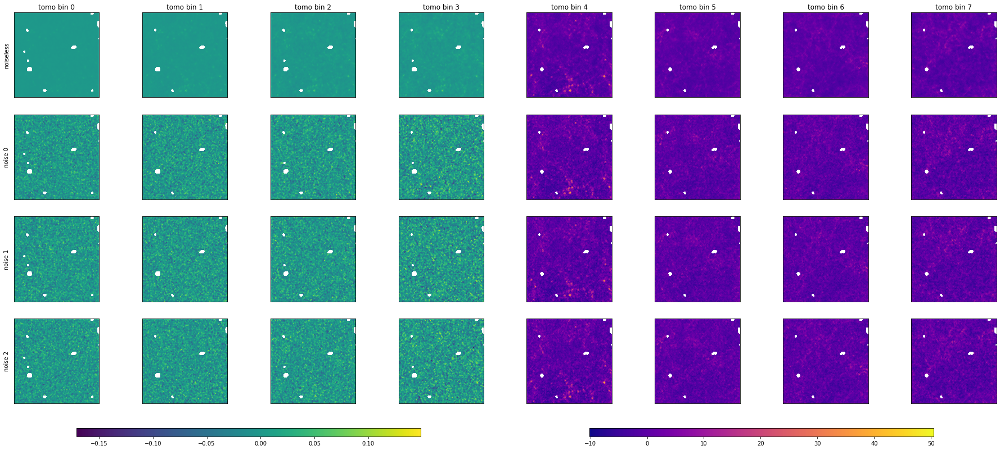

In [9]:
fig, ax = plt.subplots(figsize=(4*n_z, 4*(n_noise+1)), nrows=n_noise+1, ncols=n_z)

wl_min = np.array(gnoms[...,:n_z_metacal]).min()
wl_max = np.array(gnoms[...,:n_z_metacal]).max()

gc_min = np.array(gnoms[...,n_z_metacal:]).min()
gc_max = np.array(gnoms[...,n_z_metacal:]).max()

for i_n, gnom in enumerate(gnoms):
    for i_z in range(n_z):
        # lensing
        if i_z < n_z_metacal:
            vmin = wl_min
            vmax = wl_max
            cmap = "viridis"

        # clustering
        else:
            vmin = gc_min
            vmax = gc_max
            cmap = "plasma"

        gnom = gnoms[i_n, ..., i_z]
                
        im = ax[i_n, i_z].imshow(gnom, vmin=vmin, vmax=vmax, cmap=cmap)

        ax[i_n, i_z].set_xticks([])
        ax[i_n, i_z].set_yticks([])
        ax[i_n, i_z].set_aspect("equal")
        
        if i_z == 0:
            if i_n == 0:
                ax[i_n, i_z].set(ylabel=f"noiseless")
            else:
                ax[i_n, i_z].set(ylabel=f"noise {i_n-1}")
            
        if i_n == 0:
            ax[i_n, i_z].set(title=f"tomo bin {i_z}")
            
        if i_n == n_noise - 1:
            if i_z == 0:
                fig.colorbar(im, ax=ax[:,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
            if i_z == 4:
                fig.colorbar(im, ax=ax[:,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
                
fig.savefig("plots/noiseless_vs_noisy" + filename_suffix + ".png", bbox_inches="tight", dpi=100)    

### noiseless - noisy

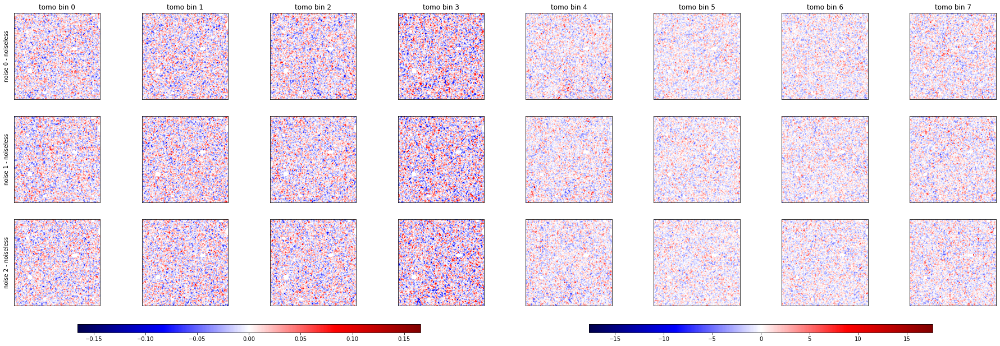

In [10]:
gnom_diff = gnoms[1:] - gnoms[0]

fig, ax = plt.subplots(figsize=(4*n_z, 4*n_noise), nrows=n_noise, ncols=n_z)

gnom_diff_metacal = gnom_diff[...,:n_z_metacal]
wl_max = np.max(np.abs(gnom_diff_metacal))
wl_min = - wl_max

gnom_diff_maglim = gnom_diff[...,n_z_metacal:]
gc_max = np.max(np.abs(gnom_diff_maglim))
gc_min = - gc_max

titles = ["noise 0 - noiseless", "noise 1 - noiseless", "noise 2 - noiseless"]

for i_n in range(n_noise):
    for i_z in range(n_z):
        # lensing
        if i_z < n_z_metacal:
            vmin = wl_min
            vmax = wl_max
            cmap = "seismic"

        # clustering
        else:
            vmin = gc_min
            vmax = gc_max
            cmap = "seismic"

        current_gnom = gnom_diff[i_n,...,i_z]
        im = ax[i_n,i_z].imshow(current_gnom, vmin=vmin, vmax=vmax, cmap=cmap)

        ax[i_n,i_z].set_xticks([])
        ax[i_n,i_z].set_yticks([])
        
        if i_z == 0:
            ax[i_n,i_z].set(ylabel=titles[i_n])
            
        if i_n == 0:
            ax[i_n,i_z].set(title=f"tomo bin {i_z}")

        if i_n == n_noise - 1:
            if i_z == 0:
                fig.colorbar(im, ax=ax[:,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
            if i_z == 4:
                fig.colorbar(im, ax=ax[:,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)

fig.savefig("plots/noiseless_minus_noisy" + filename_suffix + ".png", bbox_inches="tight", dpi=100)

## fixed noise realization

In [11]:
dv_noisy = dvs_noisy[0]

# fix noise realization, shape (2*n_params+1, n_pix, n_z)
reso = 600
gnoms = []
gnoms = np.zeros((n_maps, reso, reso, n_z))
for i_m in range(n_maps):
    for i_z in range(n_z):
        hp_map = np.full(n_pix, hp.UNSEEN)
        hp_map[data_vec_pix] = dv_noisy[i_m,:,i_z]

        gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=1, xsize=reso, ysize=reso, return_projected_map=True, no_plot=True)        
        gnoms[i_m,:,:,i_z] = gnom
        
gnoms = np.ma.masked_where(gnoms==0, gnoms)

### check derivatives

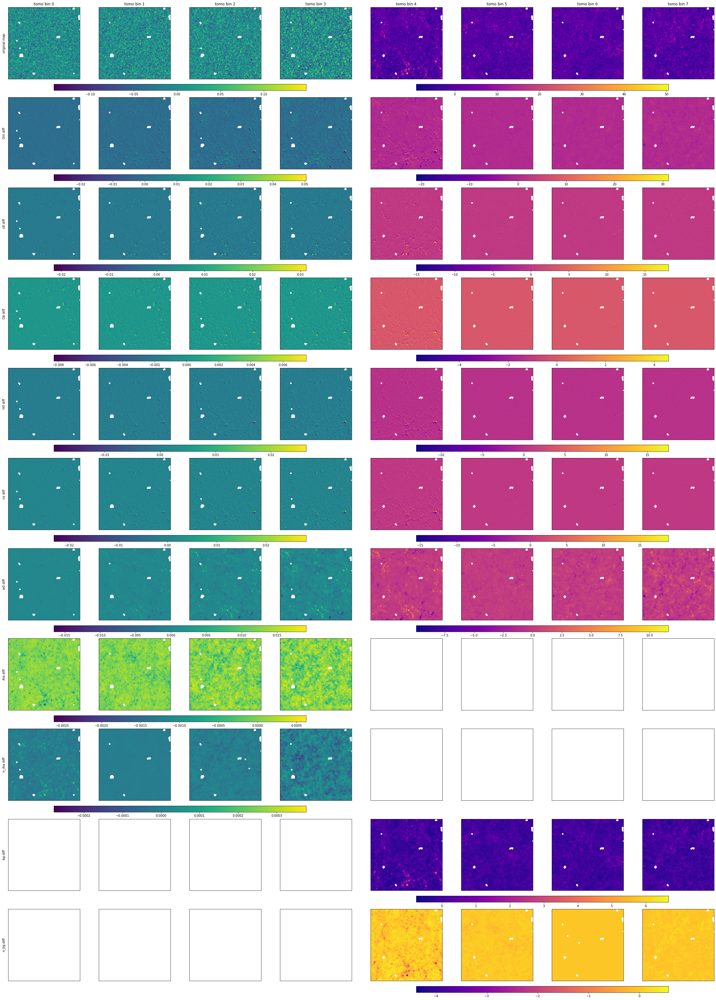

In [12]:
fig, ax = plt.subplots(figsize=(4*n_z, 4*(len(params)+1)), nrows=len(params)+1, ncols=n_z, constrained_layout=True) 

# original maps
for i_z in range(n_z):
    # lensing
    if i_z < n_z_metacal:
        vmin = gnoms[0,...,:n_z_metacal].min()
        vmax = gnoms[0,...,:n_z_metacal].max()
        cmap = "viridis"

    # clustering
    else:
        vmin = gnoms[0,...,n_z_metacal:].min()
        vmax = gnoms[0,...,n_z_metacal:].max()
        cmap = "plasma"

    im = ax[0,i_z].imshow(gnoms[0,...,i_z], vmin=vmin, vmax=vmax, cmap=cmap)
            
    if i_z == 0:
        fig.colorbar(im, ax=ax[0,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
    if i_z == 4:
        fig.colorbar(im, ax=ax[0,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)

    # cosmetics
    ax[0,i_z].set_xticks([])
    ax[0,i_z].set_yticks([])
    ax[0,i_z].set_aspect("equal")
    ax[0,i_z].set(title=f"tomo bin {i_z}")
    ax[0,0].set(ylabel="original map")

# perturbations
gnom_minus = gnoms[1::2]
gnom_plus = gnoms[2::2]

gnom_diff = gnom_plus - gnom_minus
gnom_diff = np.ma.masked_where(gnom_diff==0, gnom_diff)

wl_min = np.min(gnom_diff[...,:n_z_metacal], axis=(1,2,3))
wl_max = np.max(gnom_diff[...,:n_z_metacal], axis=(1,2,3))

gc_min = np.min(gnom_diff[...,n_z_metacal:], axis=(1,2,3))
gc_max = np.max(gnom_diff[...,n_z_metacal:], axis=(1,2,3))

for i_p, param in enumerate(params):
    for i_z in range(n_z):
        # lensing
        if i_z < n_z_metacal:
            vmin = wl_min[i_p]
            vmax = wl_max[i_p]
            cmap = "viridis"

        # clustering
        else:
            vmin = gc_min[i_p]
            vmax = gc_max[i_p]
            cmap = "plasma"
                        
        current_gnom = gnom_diff[i_p,...,i_z]
        im = ax[1+i_p,i_z].imshow(current_gnom, vmin=vmin, vmax=vmax, cmap=cmap)

        if not np.ma.count_masked(current_gnom) == reso**2:
            if i_z == 0:
                fig.colorbar(im, ax=ax[1+i_p,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
            if i_z == 4:
                fig.colorbar(im, ax=ax[1+i_p,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=40, pad=0.05)
               
        ax[1+i_p,i_z].set_xticks([])
        ax[1+i_p,i_z].set_yticks([])
        ax[1+i_p,i_z].set_aspect("equal")
        ax[1+i_p,0].set(ylabel=param + " diff")
        
fig.savefig("plots/perturbations" + filename_suffix + ".png", bbox_inches="tight", dpi=100)

### check raw maps

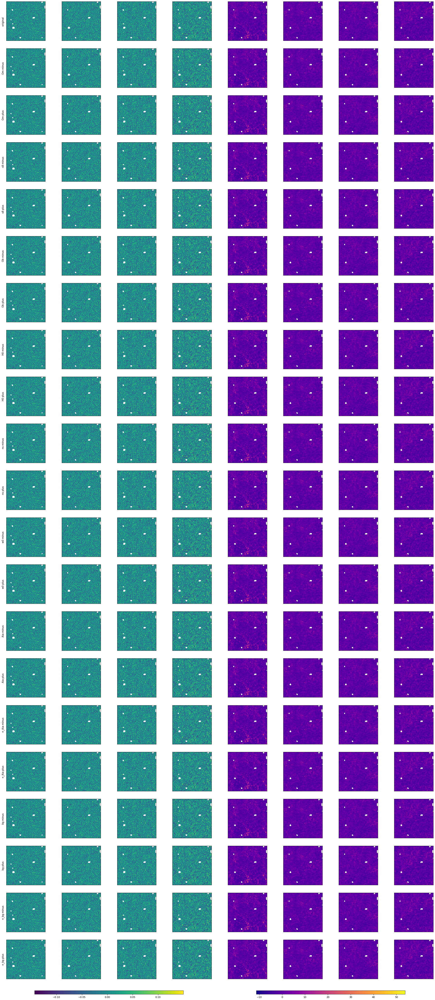

In [13]:
fig, ax = plt.subplots(figsize=(4*n_z, 4*(n_maps+1)), nrows=n_maps, ncols=n_z) 

wl_min = np.min(gnoms[...,:n_z_metacal])
wl_max = np.max(gnoms[...,:n_z_metacal])

gc_min = np.min(gnoms[...,n_z_metacal:])
gc_max = np.max(gnoms[...,n_z_metacal:])

for i_m in range(n_maps):
    if i_m == 0:
        param = "original"
        sign = ""
    else:
        param = params[(i_m - 1)//2]
        if i_m % 2 == 1:
            sign = "minus"
        else:
            sign = "plus"
                        
    for i_z in range(n_z):
        gnom = gnoms[i_m, :, :, i_z]
        
        # lensing
        if i_z < n_z_metacal:
            vmin = wl_min
            vmax = wl_max
            cmap = "viridis"
        
        # clustering
        else:
            vmin = gc_min
            vmax = gc_max
            cmap = "plasma"
                        
        im = ax[i_m,i_z].imshow(gnom, vmin=vmin, vmax=vmax, cmap=cmap)

        # cosmetics
        ax[i_m,i_z].set_xticks([])
        ax[i_m,i_z].set_yticks([])
        ax[i_m,i_z].set_aspect("equal")
        ax[i_m,0].set(ylabel=param + " " + sign)

        if i_m == n_maps - 1 and (i_z == 0 or i_z == 4):
            if i_z < n_z_metacal:
                fig.colorbar(im, ax=ax[:,:n_z_metacal], orientation="horizontal", shrink=0.7, aspect=40, pad=0.01)
            else:
                fig.colorbar(im, ax=ax[:,n_z_metacal:], orientation="horizontal", shrink=0.7, aspect=40, pad=0.01)

fig.savefig("plots/raw_maps" + filename_suffix + ".png", bbox_inches="tight", dpi=100)